In [1]:
import numpy as np
import pandas as pd
data = pd.read_csv('2020-04-22-2023-05-14-Southeast_Asia.csv')
data

,event_id_cnty,event_date,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,...,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp
0,PHL15469,21 April 2023,2023,1,Demonstrations,Protests,Peaceful protest,Protesters (Philippines),NaN,6,...,Quezon City,14.6488,121.0509,1,ABS-CBN; Manila Standard,National,"On 21 April 2023, members of multi-sectoral gr...",0,crowd size=no report,1682433778
1,MMR47279,21 April 2023,2023,1,Political violence,Violence against civilians,Abduction/forced disappearance,Military Forces of Myanmar (2021-),NaN,1,...,Hpakant,25.6138,96.3148,2,Democratic Voice of Burma; Kachin News Group; ...,Subnational-National,"On 21 April 2023, in Hmaw Bon (Maden Yang) vil...",0,NaN,1682440954
2,MMR47292,21 April 2023,2023,1,Demonstrations,Protests,Peaceful protest,Protesters (Myanmar),NaN,6,...,Let Pa Taung,22.0608,95.1387,2,Khit Thit Media; Myanmar Labour News,National,"On 21 April 2023, in Let Pa Taung area of Sali...",0,crowd size=no report,1682440954
3,MMR47303,21 April 2023,2023,1,Political violence,Battles,Armed clash,Military Forces of Myanmar (2021-),NaN,1,...,Daw Ngay Khu,19.2956,97.3670,2,VOA,International,"On 21 April 2023, near Daw Ngay Khu village (D...",0,NaN,1682440954
4,MMR47332,21 April 2023,2023,1,Strategic developments,Strategic developments,Arrests,Military Forces of Myanmar (2021-),NaN,1,...,Kayan,16.9054,96.5605,2,Ministry of Defense - NUG,National,"On 21 April 2023, in Kayan township (Yangon-So...",0,NaN,1682440954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51669,IDN3979,22 April 2020,2020,1,Demonstrations,Riots,Violent demonstration,Rioters (Indonesia),Papuan Ethnic Group (Indonesia); Prisoners (In...,5,...,Sorong,-0.8795,131.2610,1,Kompas,National,"On 22 April 2020, in Sawagumu sub-district, No...",0,crowd size=hundreds,1655847849
51670,PHL10430,22 April 2020,2020,1,Political violence,Battles,Armed clash,NPA: New People's Army,NaN,2,...,Davao City,7.0731,125.6128,1,Sunstar (Philippines); ABS-CBN; Tempo (Philipp...,National,"On 22 April 2020, two soldiers were wounded af...",0,NaN,1657063707
51671,PHL10431,22 April 2020,2020,1,Political violence,Battles,Armed clash,ASG: Abu Sayyaf,NaN,2,...,Latih,6.0359,121.0442,1,GMA News; Manila Times; Sunstar (Philippines);...,National,"On 22 April 2020, six Abu Sayyaf militants wer...",6,NaN,1657063707
51672,PHL10433,22 April 2020,2020,1,Political violence,Violence against civilians,Attack,Police Forces of the Philippines (2016-2022),NaN,1,...,Taguig,14.5333,121.0666,1,Philippine Daily Inquirer; Manila Standard; Ma...,National,"On 22 April 2020, three drug suspects were kil...",3,NaN,1657063707


In [2]:
print(data.columns)

Index(['event_id_cnty', 'event_date', 'year', 'time_precision',
       'disorder_type', 'event_type', 'sub_event_type', 'actor1',
       'assoc_actor_1', 'inter1', 'actor2', 'assoc_actor_2', 'inter2',
       'interaction', 'civilian_targeting', 'iso', 'region', 'country',
       'admin1', 'admin2', 'admin3', 'location', 'latitude', 'longitude',
       'geo_precision', 'source', 'source_scale', 'notes', 'fatalities',
       'tags', 'timestamp'],
      dtype='object')


# Event Distribution: 
## Analyze the frequency of events by disorder type, event type, and sub-event type. This could provide insights into the most common types of disorders and events occurring in the dataset.

In [3]:
import plotly.express as px

# Select the relevant columns for analysis
df = data[['disorder_type', 'event_type', 'sub_event_type']]

# Count the frequency of each category
disorder_counts = df['disorder_type'].value_counts()
event_counts = df['event_type'].value_counts()
sub_event_counts = df['sub_event_type'].value_counts()

# Create bar charts using Plotly
fig_disorder = px.bar(disorder_counts, x=disorder_counts.index, y=disorder_counts.values, labels={'x': 'Disorder Type', 'y': 'Frequency'}, title='Frequency of Events by Disorder Type')
fig_event = px.bar(event_counts, x=event_counts.index, y=event_counts.values, labels={'x': 'Event Type', 'y': 'Frequency'}, title='Frequency of Events by Event Type')
fig_sub_event = px.bar(sub_event_counts, x=sub_event_counts.index, y=sub_event_counts.values, labels={'x': 'Sub-Event Type', 'y': 'Frequency'}, title='Frequency of Events by Sub-Event Type')

# Display the charts
fig_disorder.show()
fig_event.show()
fig_sub_event.show()

# Print the frequency values
print("Frequency of Events by Disorder Type:")
print(disorder_counts)
print("\nFrequency of Events by Event Type:")
print(event_counts)
print("\nFrequency of Events by Sub-Event Type:")
print(sub_event_counts)

Frequency of Events by Disorder Type:
Political violence                    23178
Demonstrations                        18566
Strategic developments                 9680
Political violence; Demonstrations      250
Name: disorder_type, dtype: int64

Frequency of Events by Event Type:
Protests                      17978
Strategic developments         9680
Battles                        8658
Explosions/Remote violence     7669
Violence against civilians     6538
Riots                          1151
Name: event_type, dtype: int64

Frequency of Events by Sub-Event Type:
Peaceful protest                       16794
Armed clash                             8634
Attack                                  5936
Remote explosive/landmine/IED           4718
Arrests                                 4182
Looting/property destruction            3089
Shelling/artillery/missile attack       1773
Other                                    962
Protest with intervention                934
Change to group/activity

# Temporal Patterns: 
## Examine the distribution of events over time, specifically by year and event date. This analysis could reveal any notable trends or patterns in the occurrence of events.

In [4]:
import plotly.express as px
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['event_date', 'year']]

# Count the frequency of events by year
year_counts = df['year'].value_counts().sort_index()

# Create a line plot to show the distribution of events by year
fig_year = px.line(year_counts, x=year_counts.index, y=year_counts.values, labels={'x': 'Year', 'y': 'Frequency'}, title='Distribution of Events by Year')

# Create a histogram to show the distribution of events by event date
fig_event_date = px.histogram(df, x='event_date', nbins=50, labels={'x': 'Event Date', 'y': 'Frequency'}, title='Distribution of Events by Event Date')

# Display the plots
fig_year.show()
fig_event_date.show()


In [5]:

# Convert event_date to datetime format
df['event_date'] = pd.to_datetime(df['event_date'])

# Extract month and quartile information from the event_date
df['month'] = df['event_date'].dt.month
df['quartile'] = df['event_date'].dt.quarter
df['day'] = df['event_date'].dt.day


# Count the frequency of events by year, month, and quartile
year_counts = df['year'].value_counts().sort_index()
month_counts = df['month'].value_counts().sort_index()
quartile_counts = df['quartile'].value_counts().sort_index()
day_counts = df['day'].value_counts().sort_index()

# Create a line plot to show the distribution of events by year
fig_year = px.line(year_counts, x=year_counts.index, y=year_counts.values, labels={'x': 'Year', 'y': 'Frequency'}, title='Distribution of Events by Year')

# Create a bar chart to show the distribution of events by month
fig_month = px.bar(month_counts, x=month_counts.index, y=month_counts.values, labels={'x': 'Month', 'y': 'Frequency'}, title='Distribution of Events by Month')

# Create a bar chart to show the distribution of events by quartile
fig_quartile = px.bar(quartile_counts, x=quartile_counts.index, y=quartile_counts.values, labels={'x': 'Quartile', 'y': 'Frequency'}, title='Distribution of Events by Quartile')

# Display the plots
fig_year.show()
fig_month.show()
fig_quartile.show()


# Print the values
print("Distribution of Events by Year:")
print(year_counts)
print("\nDistribution of Events by Event Date:")
print(df['event_date'].value_counts())
# Print the values
print("Distribution of Events by Month:")
print(month_counts)
print("\nDistribution of Events by Day:")
print(day_counts)
print("\nDistribution of Events by Quartile:")
print(quartile_counts)


C:\Users\21263\AppData\Local\Temp\ipykernel_20336\1854811763.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\21263\AppData\Local\Temp\ipykernel_20336\1854811763.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\21263\AppData\Local\Temp\ipykernel_20336\1854811763.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

Distribution of Events by Year:
2020     4483
2021    21258
2022    20977
2023     4956
Name: year, dtype: int64

Distribution of Events by Event Date:
2021-02-08    135
2021-02-09    130
2021-03-08    126
2021-02-10    123
2022-09-06    122
             ... 
2020-09-27      5
2020-07-05      5
2020-12-19      5
2020-11-07      5
2020-11-22      4
Name: event_date, Length: 1095, dtype: int64
Distribution of Events by Month:
1     3907
2     5270
3     5447
4     4466
5     4722
6     4001
7     3519
8     3635
9     4550
10    4483
11    4010
12    3664
Name: month, dtype: int64

Distribution of Events by Day:
1     1705
2     1612
3     1698
4     1570
5     1699
6     1575
7     1835
8     2039
9     1826
10    1837
11    1724
12    1730
13    1771
14    1773
15    1842
16    1625
17    1593
18    1682
19    1709
20    1614
21    1617
22    1750
23    1702
24    1659
25    1686
26    1571
27    1648
28    1710
29    1452
30    1446
31     974
Name: day, dtype: int64

Distribution of 

In [6]:
import plotly.express as px
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['event_date', 'year']]

# Convert event_date to datetime format
df['event_date'] = pd.to_datetime(df['event_date'])

# Extract month and quartile information from the event_date
df['month'] = df['event_date'].dt.month
df['quartile'] = df['event_date'].dt.quarter

# Count the frequency of events by year, month, and quartile
year_counts = df['year'].value_counts().sort_index()
month_counts = df['month'].value_counts().sort_index()
quartile_counts = df['quartile'].value_counts().sort_index()

# Create a line plot to show the distribution of events by year
fig_year = px.line(year_counts, x=year_counts.index, y=year_counts.values, labels={'x': 'Year', 'y': 'Frequency'}, title='Distribution of Events by Year')
fig_year.update_traces(line=dict(color='blue', width=3), marker=dict(color='blue', size=8))

# Create a bar chart to show the distribution of events by month
fig_month = px.bar(month_counts, x=month_counts.index, y=month_counts.values, labels={'x': 'Month', 'y': 'Frequency'}, title='Distribution of Events by Month')
fig_month.update_traces(marker_color='orange')

# Create a bar chart to show the distribution of events by quartile
fig_quartile = px.bar(quartile_counts, x=quartile_counts.index, y=quartile_counts.values, labels={'x': 'Quartile', 'y': 'Frequency'}, title='Distribution of Events by Quartile')
fig_quartile.update_traces(marker_color='green')

# Update layout for all figures
fig_year.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(
        gridcolor='lightgray',
        tickfont=dict(size=12),
    ),
    yaxis=dict(
        gridcolor='lightgray',
        tickfont=dict(size=12),
    )
)

fig_month.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(
        gridcolor='lightgray',
        tickfont=dict(size=12),
    ),
    yaxis=dict(
        gridcolor='lightgray',
        tickfont=dict(size=12),
    )
)

fig_quartile.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(
        gridcolor='lightgray',
        tickfont=dict(size=12),
    ),
    yaxis=dict(
        gridcolor='lightgray',
        tickfont=dict(size=12),
    )
)

# Display the plots
fig_year.show()
fig_month.show()
fig_quartile.show()


C:\Users\21263\AppData\Local\Temp\ipykernel_20336\3493754606.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\21263\AppData\Local\Temp\ipykernel_20336\3493754606.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\21263\AppData\Local\Temp\ipykernel_20336\3493754606.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

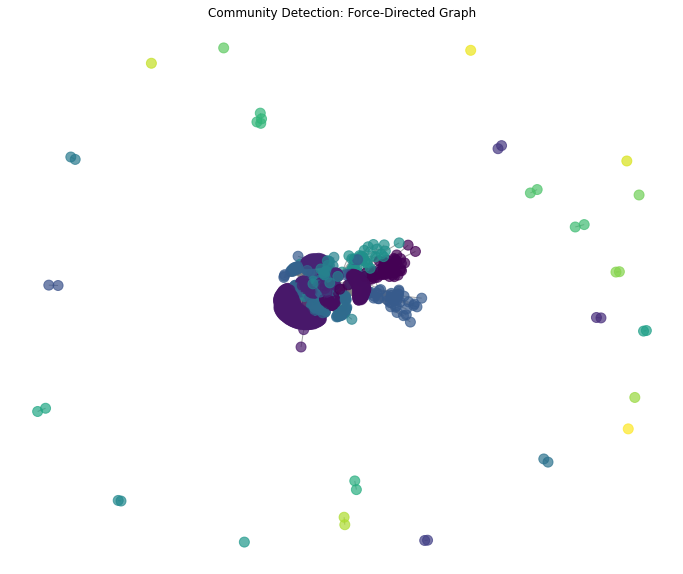

In [7]:
import pandas as pd
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['actor1', 'actor2']]

# Create an empty graph
G = nx.Graph()

# Add edges to the graph from the actor1 and actor2 columns
edges = df[['actor1', 'actor2']].values.tolist()
G.add_edges_from(edges)

# Apply the Louvain algorithm for community detection
partition = community_louvain.best_partition(G)

# Set the community information as a node attribute
nx.set_node_attributes(G, partition, 'community')

# Draw the force-directed graph with communities
pos = nx.spring_layout(G, seed=42)
plt.figure(figsize=(12, 10))
nx.draw_networkx(G, pos, with_labels=False, node_size=100, node_color=list(partition.values()), cmap='viridis', alpha=0.7, edge_color='gray')
plt.title('Community Detection: Force-Directed Graph')
plt.axis('off')
plt.show()


# Actors and Associations: 
## Explore the involvement of actor1 and actor2 in events, along with associated actors. This analysis could shed light on the key actors and their relationships in the context of the recorded events. 

In [8]:
import pandas as pd
import plotly.express as px

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['actor1', 'actor2']]

# Actor Frequency Analysis
actor1_counts = df['actor1'].value_counts().reset_index()
actor1_counts.columns = ['Actor', 'Frequency']
actor1_fig = px.bar(actor1_counts, x='Actor', y='Frequency', title='Actor Frequency')
actor1_fig.show()

# Co-occurrence Analysis
cooccurrence_counts = df.groupby(['actor1', 'actor2']).size().reset_index(name='Count')
cooccurrence_fig = px.sunburst(cooccurrence_counts, path=['actor1', 'actor2'], values='Count',
                               title='Actor Co-occurrence')
cooccurrence_fig.update_traces(textinfo='label+percent entry')
cooccurrence_fig.show()


In [9]:
df = data[['actor1', 'actor2']]
#Actor Frequency Analysis
actor1_counts = df['actor1'].value_counts().reset_index()
actor1_counts.columns = ['Actor', 'Frequency']
top_actors = actor1_counts.head(5) # Selecting the top 5 most frequent actors

#Bar plot for top 5 actor frequencies
actor1_fig = px.bar(top_actors, x='Actor', y='Frequency', title='Top 5 Actor Frequencies')
actor1_fig.show()

#Co-occurrence Analysis
cooccurrence_counts = df.groupby(['actor1', 'actor2']).size().reset_index(name='Count')
top_cooccurrences = cooccurrence_counts.head(10) # Selecting the top 10 co-occurrences

#Sunburst plot for top 10 actor co-occurrences
cooccurrence_fig = px.sunburst(top_cooccurrences, path=['actor1', 'actor2'], values='Count',
title='Top 10 Actor Co-occurrences')
cooccurrence_fig.update_traces(textinfo='label+percent entry')
cooccurrence_fig.show()

In [10]:
# Co-occurrence Analysis
cooccurrence_counts = df.groupby(['actor1', 'actor2']).size().reset_index(name='Count')
top_cooccurrences = cooccurrence_counts.head(10)  # Selecting the top 10 co-occurrences

print(top_cooccurrences)


                                     actor1  \
0  21KPG: 21 Guerrilla Force - Kyaukpadaung   
1  21KPG: 21 Guerrilla Force - Kyaukpadaung   
2           27 Revolution Forces - Myingyan   
3           27 Revolution Forces - Myingyan   
4           27 Revolution Forces - Myingyan   
5            44st-UG: 44st Urban Guerrillas   
6                        5 Brothers Younger   
7                         96 Soldiers - PDF   
8                         96 Soldiers - PDF   
9               9KFF: 9 Kwins Fighter Force   

                               actor2  Count  
0                 Civilians (Myanmar)      2  
1  Military Forces of Myanmar (2021-)      1  
2                 Civilians (Myanmar)      1  
3  Military Forces of Myanmar (2021-)      9  
4                        Pyu Saw Htee      2  
5    Police Forces of Myanmar (2021-)      2  
6                 Civilians (Myanmar)      1  
7  Military Forces of Myanmar (2021-)      1  
8    Police Forces of Myanmar (2021-)      1  
9  Military 

In [11]:
import pandas as pd
import plotly.express as px

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant column for analysis
df = data['actor1']

# Actor Frequency Analysis
actor1_counts = df.value_counts().reset_index()
actor1_counts.columns = ['Actor', 'Frequency']

# Create a bar chart to visualize the actor frequency
actor1_fig = px.bar(actor1_counts, x='Actor', y='Frequency', title='Actor Frequency')

# Customize the appearance of the bar chart
actor1_fig.update_layout(xaxis_title='Actor', yaxis_title='Frequency')

# Display the bar chart
actor1_fig.show()


In [12]:
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['actor1', 'actor2']]

# Actor Frequency Analysis
actor1_counts = df['actor1'].value_counts()
actor2_counts = df['actor2'].value_counts()

# Print the frequency of actors 1
print("Actor 1 Frequency:")
print(actor1_counts)

# Print the frequency of actors 2
print("Actor 2 Frequency:")
print(actor2_counts)


Actor 1 Frequency:
Military Forces of Myanmar (2021-)           13822
Protesters (Myanmar)                          8399
Protesters (Indonesia)                        6063
Unidentified Armed Group (Myanmar)            3803
Protesters (Thailand)                         1992
                                             ...  
SNPDF: Shwe Nyaung People's Defense Force        1
KUG                                              1
Local Lark Guerrilla Revolution Force            1
MRA: Myanmar Revolution Army                     1
Ifia-fia Communal Militia (Indonesia)            1
Name: actor1, Length: 1316, dtype: int64
Actor 2 Frequency:
Civilians (Myanmar)                               12344
Military Forces of Myanmar (2021-)                 6211
Civilians (Philippines)                            1768
Police Forces of Myanmar (2021-)                    997
Military Forces of the Philippines (2016-2022)      628
                                                  ...  
Salingyi G-Z Local PDF  

In [13]:
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['actor1', 'actor2']]

# Actor Frequency Analysis
actor1_counts = df['actor1'].value_counts()
actor2_counts = df['actor2'].value_counts()

# Get the actors with the highest frequency
actor1_most_frequent = actor1_counts.idxmax()
actor2_most_frequent = actor2_counts.idxmax()

# Print the actors with the highest frequency and their connection
print("Actor 1 with highest frequency:", actor1_most_frequent)
print("Actor 2 with highest frequency:", actor2_most_frequent)
print("Connection between Actor 1 and Actor 2:")

# Filter the DataFrame to include only the rows with the highest frequency actors
filtered_df = df[(df['actor1'] == actor1_most_frequent) & (df['actor2'] == actor2_most_frequent)]

# Print the filtered DataFrame
print(filtered_df)


Actor 1 with highest frequency: Military Forces of Myanmar (2021-)
Actor 2 with highest frequency: Civilians (Myanmar)
Connection between Actor 1 and Actor 2:
                                   actor1               actor2
1      Military Forces of Myanmar (2021-)  Civilians (Myanmar)
4      Military Forces of Myanmar (2021-)  Civilians (Myanmar)
10     Military Forces of Myanmar (2021-)  Civilians (Myanmar)
14     Military Forces of Myanmar (2021-)  Civilians (Myanmar)
27     Military Forces of Myanmar (2021-)  Civilians (Myanmar)
...                                   ...                  ...
46014  Military Forces of Myanmar (2021-)  Civilians (Myanmar)
46145  Military Forces of Myanmar (2021-)  Civilians (Myanmar)
46762  Military Forces of Myanmar (2021-)  Civilians (Myanmar)
46763  Military Forces of Myanmar (2021-)  Civilians (Myanmar)
46769  Military Forces of Myanmar (2021-)  Civilians (Myanmar)

[9038 rows x 2 columns]


In [14]:
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['actor1', 'actor2']]

# Actor Frequency Analysis
actor1_counts = df['actor1'].value_counts()
actor2_counts = df['actor2'].value_counts()

# Get the top 10 actors with the highest frequency
top_10_actor1 = actor1_counts.nlargest(10).index.tolist()
top_10_actor2 = actor2_counts.nlargest(10).index.tolist()

# Print the top 10 actors and their connections
print("Top 10 Actors 1 with highest frequency:")
for actor in top_10_actor1:
    print(f"\n{actor}:")
    print(df[df['actor1'] == actor]['actor2'].to_string(index=False))

print("\nTop 10 Actors 2 with highest frequency:")
for actor in top_10_actor2:
    print(f"\n{actor}:")
    print(df[df['actor2'] == actor]['actor1'].to_string(index=False))


Top 10 Actors 1 with highest frequency:

Military Forces of Myanmar (2021-):
                               Civilians (Myanmar)
         KNDF: Karenni Nationalities Defense Force
                               Civilians (Myanmar)
   CNF/CNA: Chin National Front/Chin National Army
                               Civilians (Myanmar)
KNU/KNLA: Karen National Union/Karen National L...
                Unidentified Armed Group (Myanmar)
                               Civilians (Myanmar)
                   People's Defense Force - Shwebo
                               Civilians (Myanmar)
                               Civilians (Myanmar)
                                               NaN
                               Civilians (Myanmar)
                               Civilians (Myanmar)
                               Civilians (Myanmar)
                               Civilians (Myanmar)
                               Civilians (Myanmar)
                               Civilians (Myanmar)
KNU/K

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [15]:
import pandas as pd
import plotly.graph_objects as go

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['actor1', 'actor2']]

# Actor Frequency Analysis
actor1_counts = df['actor1'].value_counts()
actor2_counts = df['actor2'].value_counts()

# Get the top 10 actors with the highest frequency
top_10_actor1 = actor1_counts.nlargest(10).index.tolist()
top_10_actor2 = actor2_counts.nlargest(10).index.tolist()

# Create a DataFrame to store the connections
connections_df = pd.DataFrame(columns=['Actor 1', 'Actor 2'])

# Iterate over the top 10 actors and store their connections in the DataFrame
for actor in top_10_actor1:
    connections = df[df['actor1'] == actor]['actor2'].to_list()
    connections_df = connections_df.append({'Actor 1': actor, 'Actor 2': connections}, ignore_index=True)

for actor in top_10_actor2:
    connections = df[df['actor2'] == actor]['actor1'].to_list()
    connections_df = connections_df.append({'Actor 1': connections, 'Actor 2': actor}, ignore_index=True)

# Print the connections DataFrame
print("Connections between top 10 Actors 1 and Actors 2:")
print(connections_df)

# Create a plot to visualize the connections
fig = go.Figure(data=[go.Table(
    header=dict(values=['Actor 1', 'Actor 2']),
    cells=dict(values=[connections_df['Actor 1'], connections_df['Actor 2']])
)])

# Update the layout of the plot
fig.update_layout(title='Connections between top 10 Actors 1 and Actors 2')

# Display the plot
fig.show()


Connections between top 10 Actors 1 and Actors 2:
                                              Actor 1  \
0                  Military Forces of Myanmar (2021-)   
1                                Protesters (Myanmar)   
2                              Protesters (Indonesia)   
3                  Unidentified Armed Group (Myanmar)   
4                               Protesters (Thailand)   
5                                 Rioters (Indonesia)   
6                              NPA: New People's Army   
7                            Protesters (Philippines)   
8              Unidentified Armed Group (Philippines)   
9                                 Civilians (Myanmar)   
10  [Military Forces of Myanmar (2021-), Military ...   
11  [KNDF: Karenni Nationalities Defense Force, PS...   
12  [Police Forces of the Philippines (2022-), Uni...   
13  [People's Defense Force - Thegon, Tactic of MU...   
14  [ASG: Abu Sayyaf, Unidentified Armed Group (Ph...   
15  [Unidentified Armed Group (Indones

C:\Users\21263\AppData\Local\Temp\ipykernel_20336\3518677222.py:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\21263\AppData\Local\Temp\ipykernel_20336\3518677222.py:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\21263\AppData\Local\Temp\ipykernel_20336\3518677222.py:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\21263\AppData\Local\Temp\ipykernel_20336\3518677222.py:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\21263\AppData\Local\Temp\ipykernel_20336\3518677222.py:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.co

In [16]:
import pandas as pd
import plotly.graph_objects as go

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['actor1', 'actor2']]

# Actor Frequency Analysis
actor1_counts = df['actor1'].value_counts()
actor2_counts = df['actor2'].value_counts()

# Get the top 10 actors with the highest frequency
top_10_actor1 = actor1_counts.nlargest(10)
top_10_actor2 = actor2_counts.nlargest(10)

# Create a pie plot for top 10 actors 1
fig_actor1 = go.Figure(data=[go.Pie(labels=top_10_actor1.index, values=top_10_actor1.values)])

# Set the title and layout of the plot
fig_actor1.update_layout(title='Top 10 Actors 1 with Highest Frequency')

# Create a pie plot for top 10 actors 2
fig_actor2 = go.Figure(data=[go.Pie(labels=top_10_actor2.index, values=top_10_actor2.values)])

# Set the title and layout of the plot
fig_actor2.update_layout(title='Top 10 Actors 2 with Highest Frequency')

# Display the plots
fig_actor1.show()
fig_actor2.show()


In [17]:
import pandas as pd
import plotly.graph_objects as go

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['assoc_actor_1', 'assoc_actor_2']]

# Associated Actor Frequency Analysis
assoc_actor1_counts = df['assoc_actor_1'].value_counts()
assoc_actor2_counts = df['assoc_actor_2'].value_counts()

# Get the top 10 associated actors 1 with the highest frequency
top_10_assoc_actor1 = assoc_actor1_counts.nlargest(10)
top_10_assoc_actor2 = assoc_actor2_counts.nlargest(10)

# Create a pie plot for top 10 associated actors 1
fig_assoc_actor1 = go.Figure(data=[go.Pie(labels=top_10_assoc_actor1.index, values=top_10_assoc_actor1.values)])

# Set the title and layout of the plot
fig_assoc_actor1.update_layout(title='Top 10 Associated Actors 1 with Highest Frequency')

# Create a pie plot for top 10 associated actors 2
fig_assoc_actor2 = go.Figure(data=[go.Pie(labels=top_10_assoc_actor2.index, values=top_10_assoc_actor2.values)])

# Set the title and layout of the plot
fig_assoc_actor2.update_layout(title='Top 10 Associated Actors 2 with Highest Frequency')

# Display the plots
fig_assoc_actor1.show()
fig_assoc_actor2.show()


In [18]:
import pandas as pd
import plotly.graph_objects as go

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['actor1', 'actor2', 'assoc_actor_1', 'assoc_actor_2']]

# Actor Frequency Analysis
actor1_counts = df['actor1'].value_counts()
actor2_counts = df['actor2'].value_counts()

# Get the top 10 actors with the highest frequency
top_10_actors1 = actor1_counts.nlargest(10)
top_10_actors2 = actor2_counts.nlargest(10)

# Create a list to store associated actors for each top actor
associated_actors = []

# Iterate over the top 10 actors 1
for actor in top_10_actors1.index:
    # Filter the dataframe for rows where actor1 matches the current top actor
    actor_data = df[df['actor1'] == actor]
    # Get the associated actors for the current top actor
    assoc_actors = actor_data['assoc_actor_1'].value_counts().nlargest(5)
    # Add the associated actors to the list
    associated_actors.extend(assoc_actors.index)

# Iterate over the top 10 actors 2
for actor in top_10_actors2.index:
    # Filter the dataframe for rows where actor2 matches the current top actor
    actor_data = df[df['actor2'] == actor]
    # Get the associated actors for the current top actor
    assoc_actors = actor_data['assoc_actor_2'].value_counts().nlargest(5)
    # Add the associated actors to the list
    associated_actors.extend(assoc_actors.index)

# Create a frequency count for the associated actors
associated_actor_counts = pd.Series(associated_actors).value_counts().nlargest(10)

# Create a pie plot for the top 10 actors and their associated actors
fig_associated_actors = go.Figure(data=[go.Pie(labels=associated_actor_counts.index, values=associated_actor_counts.values)])

# Set the title and layout of the plot
fig_associated_actors.update_layout(title='Top 10 Actors and Their Connected Associated Actors')

# Display the plot
fig_associated_actors.show()


In [19]:
import pandas as pd
import plotly.graph_objects as go

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['year', 'actor1', 'actor2', 'assoc_actor_1', 'assoc_actor_2']]

# Actor Frequency Analysis
actor1_counts = df['actor1'].value_counts()
actor2_counts = df['actor2'].value_counts()

# Get the top 10 actors with the highest frequency
top_10_actors1 = actor1_counts.nlargest(10)
top_10_actors2 = actor2_counts.nlargest(10)

# Create a list to store associated actors for each top actor by year
associated_actors_by_year = []

# Iterate over the top 10 actors 1
for actor in top_10_actors1.index:
    # Filter the dataframe for rows where actor1 matches the current top actor
    actor_data = df[df['actor1'] == actor]
    # Group the associated actors by year and get the top associated actors for each year
    assoc_actors_by_year = actor_data.groupby(['year', 'assoc_actor_1']).size().groupby(level=0).nlargest(5)
    # Add the associated actors by year to the list
    associated_actors_by_year.append(assoc_actors_by_year)

# Iterate over the top 10 actors 2
for actor in top_10_actors2.index:
    # Filter the dataframe for rows where actor2 matches the current top actor
    actor_data = df[df['actor2'] == actor]
    # Group the associated actors by year and get the top associated actors for each year
    assoc_actors_by_year = actor_data.groupby(['year', 'assoc_actor_2']).size().groupby(level=0).nlargest(5)
    # Add the associated actors by year to the list
    associated_actors_by_year.append(assoc_actors_by_year)

# Concatenate the associated actors by year into a single series
associated_actor_counts_by_year = pd.concat(associated_actors_by_year)

# Get the top 10 associated actors overall
top_10_associated_actors = associated_actor_counts_by_year.groupby(level=1).sum().nlargest(10)

# Create a pie plot for the top 10 actors and their associated actors by year
fig_associated_actors_by_year = go.Figure(data=[go.Pie(labels=top_10_associated_actors.index, values=top_10_associated_actors.values)])

# Set the title and layout of the plot
fig_associated_actors_by_year.update_layout(title='Top 10 Actors and Their Connected Associated Actors (Grouped by Year)')

# Display the plot
fig_associated_actors_by_year.show()


In [20]:
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['year', 'actor1', 'actor2', 'assoc_actor_1', 'assoc_actor_2']]

# Actor Frequency Analysis
actor1_counts = df['actor1'].value_counts()
actor2_counts = df['actor2'].value_counts()

# Get the top 10 actors with the highest frequency
top_10_actors1 = actor1_counts.nlargest(10)
top_10_actors2 = actor2_counts.nlargest(10)

# Iterate over the years
for year in df['year'].unique():
    print(f"Year: {year}")
    
    # Filter the dataframe for the current year
    year_data = df[df['year'] == year]
    
    print("Top 10 Actors:")
    # Print the top 10 actors for actor1
    top_actors1 = year_data['actor1'].value_counts().nlargest(10)
    print(top_actors1)
    
    # Print the top 10 actors for actor2
    top_actors2 = year_data['actor2'].value_counts().nlargest(10)
    print(top_actors2)
    
    print("Top Associated Actors:")
    # Print the top associated actors for actor1
    top_assoc_actors1 = year_data['assoc_actor_1'].value_counts().nlargest(10)
    print(top_assoc_actors1)
    
    # Print the top associated actors for actor2
    top_assoc_actors2 = year_data['assoc_actor_2'].value_counts().nlargest(10)
    print(top_assoc_actors2)
    
    print("-------------------")


Year: 2023
Top 10 Actors:
Military Forces of Myanmar (2021-)    1523
Protesters (Indonesia)                 696
Protesters (Myanmar)                   311
Unidentified Armed Group (Myanmar)     309
Unidentified Anti-Coup Armed Group     116
Protesters (Thailand)                  100
Civilians (Myanmar)                     98
Protesters (Philippines)                93
Rioters (Indonesia)                     88
NPA: New People's Army                  87
Name: actor1, dtype: int64
Civilians (Myanmar)                                                   1417
Military Forces of Myanmar (2021-)                                     898
Civilians (Philippines)                                                136
Military Forces of the Philippines (2022-)                              87
Police Forces of Myanmar (2021-)                                        85
Unidentified Anti-Coup Armed Group                                      60
Civilians (Indonesia)                                              

In [21]:
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['year', 'actor1', 'actor2', 'assoc_actor_1', 'assoc_actor_2']]

# Iterate over the years
for year in df['year'].unique():
    print(f"Year: {year}\n")
    
    # Filter the dataframe for the current year
    year_data = df[df['year'] == year]
    
    print("Top 10 Actors:")
    # Print the top 10 actors for actor1
    top_actors1 = year_data['actor1'].value_counts().nlargest(10)
    print(top_actors1.to_string())
    
    # Print the top 10 actors for actor2
    top_actors2 = year_data['actor2'].value_counts().nlargest(10)
    print(top_actors2.to_string())
    
    print("\nTop Associated Actors:")
    # Print the top associated actors for actor1
    top_assoc_actors1 = year_data['assoc_actor_1'].value_counts().nlargest(10)
    print(top_assoc_actors1.to_string())
    
    # Print the top associated actors for actor2
    top_assoc_actors2 = year_data['assoc_actor_2'].value_counts().nlargest(10)
    print(top_assoc_actors2.to_string())
    
    print("-------------------\n")


Year: 2023

Top 10 Actors:
Military Forces of Myanmar (2021-)    1523
Protesters (Indonesia)                 696
Protesters (Myanmar)                   311
Unidentified Armed Group (Myanmar)     309
Unidentified Anti-Coup Armed Group     116
Protesters (Thailand)                  100
Civilians (Myanmar)                     98
Protesters (Philippines)                93
Rioters (Indonesia)                     88
NPA: New People's Army                  87
Civilians (Myanmar)                                                   1417
Military Forces of Myanmar (2021-)                                     898
Civilians (Philippines)                                                136
Military Forces of the Philippines (2022-)                              87
Police Forces of Myanmar (2021-)                                        85
Unidentified Anti-Coup Armed Group                                      60
Civilians (Indonesia)                                                   59
Pyu Saw Htee      

In [22]:
import pandas as pd
import plotly.express as px

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['year', 'actor1', 'actor2', 'assoc_actor_1', 'assoc_actor_2']]

# Iterate over the years
for year in df['year'].unique():
    # Filter the dataframe for the current year
    year_data = df[df['year'] == year]
    
    # Calculate the top 10 actors for actor1
    top_actors1 = year_data['actor1'].value_counts().nlargest(10)
    # Calculate the top 10 actors for actor2
    top_actors2 = year_data['actor2'].value_counts().nlargest(10)
    
    # Create a bar plot for the top actors for actor1
    fig_actors1 = px.bar(top_actors1, x=top_actors1.index, y=top_actors1.values,
                         labels={'x': 'Actor', 'y': 'Frequency'},
                         title=f'Top 10 Actors for Year {year} (Actor1)')
    fig_actors1.show()
    
    # Create a bar plot for the top actors for actor2
    fig_actors2 = px.bar(top_actors2, x=top_actors2.index, y=top_actors2.values,
                         labels={'x': 'Actor', 'y': 'Frequency'},
                         title=f'Top 10 Actors for Year {year} (Actor2)')
    fig_actors2.show()
    
    # Calculate the top 10 associated actors for actor1
    top_assoc_actors1 = year_data['assoc_actor_1'].value_counts().nlargest(10)
    # Calculate the top 10 associated actors for actor2
    top_assoc_actors2 = year_data['assoc_actor_2'].value_counts().nlargest(10)
    
    # Create a bar plot for the top associated actors for actor1
    fig_assoc_actors1 = px.bar(top_assoc_actors1, x=top_assoc_actors1.index, y=top_assoc_actors1.values,
                               labels={'x': 'Associated Actor', 'y': 'Frequency'},
                               title=f'Top 10 Associated Actors for Year {year} (Actor1)')
    fig_assoc_actors1.show()
    
    # Create a bar plot for the top associated actors for actor2
    fig_assoc_actors2 = px.bar(top_assoc_actors2, x=top_assoc_actors2.index, y=top_assoc_actors2.values,
                               labels={'x': 'Associated Actor', 'y': 'Frequency'},
                               title=f'Top 10 Associated Actors for Year {year} (Actor2)')
    fig_assoc_actors2.show()


In [23]:
import plotly.express as px
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['actor1', 'assoc_actor_1', 'actor2', 'assoc_actor_2']]

# Get the top Actor1 and associated actors
top_actor1 = df['actor1'].value_counts().index[0]
top_assoc_actor1 = df.loc[df['actor1'] == top_actor1, 'assoc_actor_1'].value_counts().head(10)

# Get the top Actor2 and associated actors
top_actor2 = df['actor2'].value_counts().index[0]
top_assoc_actor2 = df.loc[df['actor2'] == top_actor2, 'assoc_actor_2'].value_counts().head(10)

# Concatenate the top associated actors for Actor1 and Actor2
top_assoc_actors = pd.concat([top_assoc_actor1, top_assoc_actor2])

# Create a bar plot
fig = px.bar(top_assoc_actors, x=top_assoc_actors.index, y=top_assoc_actors.values, labels={'x': 'Associated Actor', 'y': 'Frequency'}, title='Top Associated Actors for Top Actor1 and Actor2')

# Display the plot
fig.show()


In [24]:
import plotly.graph_objects as go
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['actor1', 'assoc_actor_1', 'actor2', 'assoc_actor_2']]

# Get the top 10 Actor1 and associated actors
top_actors1 = df['actor1'].value_counts().head(3).index

fig1 = go.Figure()
for actor in top_actors1:
    top_assoc_actors1 = df.loc[df['actor1'] == actor, 'assoc_actor_1'].value_counts().head(10)
    fig1.add_trace(go.Bar(x=top_assoc_actors1.index, y=top_assoc_actors1.values, name=actor))

fig1.update_layout(barmode='stack', xaxis={'title': 'Associated Actor'}, yaxis={'title': 'Frequency'}, title='Top Associated Actors for Top 10 Actor1')

# Get the top 10 Actor2 and associated actors
top_actors2 = df['actor2'].value_counts().head(3).index

fig2 = go.Figure()
for actor in top_actors2:
    top_assoc_actors2 = df.loc[df['actor2'] == actor, 'assoc_actor_2'].value_counts().head(10)
    fig2.add_trace(go.Bar(x=top_assoc_actors2.index, y=top_assoc_actors2.values, name=actor))

fig2.update_layout(barmode='stack', xaxis={'title': 'Associated Actor'}, yaxis={'title': 'Frequency'}, title='Top Associated Actors for Top 10 Actor2')

# Display the plots
fig1.show()
fig2.show()


In [25]:
import plotly.graph_objects as go
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['actor1', 'assoc_actor_1', 'actor2', 'assoc_actor_2']]

# Get the top 10 Actor1 and associated actors
top_actors1 = df['actor1'].value_counts().head(3).index

fig1 = go.Figure()
for actor in top_actors1:
    top_assoc_actors1 = df.loc[df['actor1'] == actor, 'assoc_actor_1'].value_counts().head(10)
    fig1.add_trace(go.Bar(x=top_assoc_actors1.index, y=top_assoc_actors1.values, name=actor))

fig1.update_layout(barmode='stack', xaxis={'title': 'Associated Actor'}, yaxis={'title': 'Frequency'}, title='Top Associated Actors for Top 10 Actor1: {}'.format(", ".join(top_actors1)))

# Get the top 10 Actor2 and associated actors
top_actors2 = df['actor2'].value_counts().head(3).index

fig2 = go.Figure()
for actor in top_actors2:
    top_assoc_actors2 = df.loc[df['actor2'] == actor, 'assoc_actor_2'].value_counts().head(10)
    fig2.add_trace(go.Bar(x=top_assoc_actors2.index, y=top_assoc_actors2.values, name=actor))

fig2.update_layout(barmode='stack', xaxis={'title': 'Associated Actor'}, yaxis={'title': 'Frequency'}, title='Top Associated Actors for Top 10 Actor2: {}'.format(", ".join(top_actors2)))

# Display the plots
fig1.show()
fig2.show()


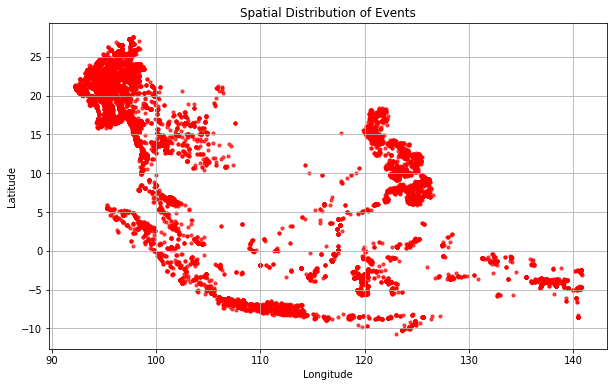

In [26]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for geographic analysis
df = data[['latitude', 'longitude', 'country']]

# Remove rows with missing latitude or longitude values
df = df.dropna(subset=['latitude', 'longitude'])

# Create a scatter plot to visualize the spatial distribution of events
plt.figure(figsize=(10, 6))
plt.scatter(df['longitude'], df['latitude'], s=10, c='red', alpha=0.7)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Spatial Distribution of Events')
plt.grid(True)
plt.show()


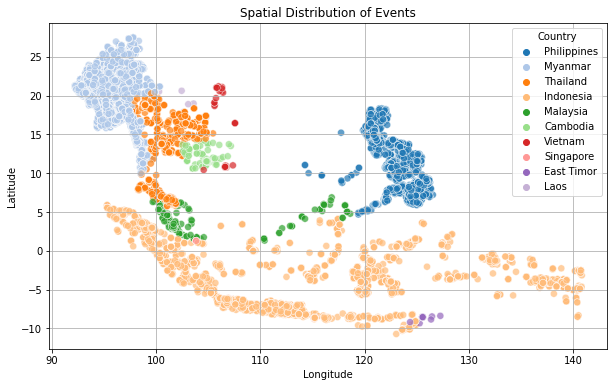

In [27]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for geographic analysis
df = data[['latitude', 'longitude', 'country']]

# Remove rows with missing latitude or longitude values
df = df.dropna(subset=['latitude', 'longitude'])

# Create a scatter plot to visualize the spatial distribution of events
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='longitude', y='latitude', hue='country', s=50, alpha=0.7, palette='tab20')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Spatial Distribution of Events')
plt.grid(True)
plt.legend(title='Country', bbox_to_anchor=(1, 1))
plt.show()


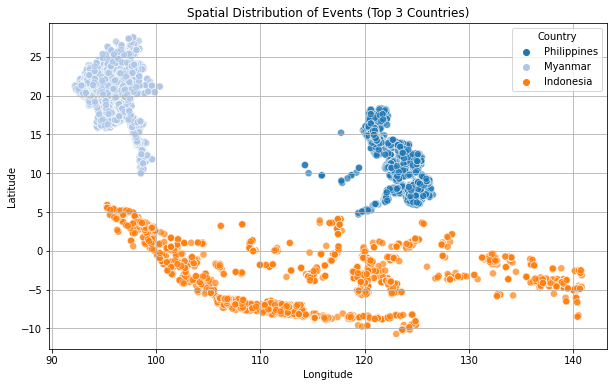

In [28]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for geographic analysis
df = data[['latitude', 'longitude', 'country']]

# Remove rows with missing latitude or longitude values
df = df.dropna(subset=['latitude', 'longitude'])

# Get the top 3 countries with the most events
top_countries = df['country'].value_counts().nlargest(3).index

# Filter the dataframe to include only the top 3 countries
df_top_countries = df[df['country'].isin(top_countries)]

# Create a scatter plot to visualize the spatial distribution of events for the top 3 countries
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_top_countries, x='longitude', y='latitude', hue='country', s=50, alpha=0.7, palette='tab20')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Spatial Distribution of Events (Top 3 Countries)')
plt.grid(True)
plt.legend(title='Country', bbox_to_anchor=(1, 1))
plt.show()


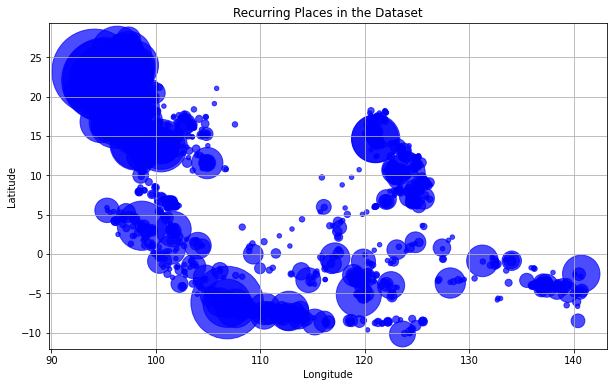

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['latitude', 'longitude', 'location']]

# Group the data by latitude and longitude to identify recurring places
place_counts = df.groupby(['latitude', 'longitude']).size().reset_index(name='count')
recurring_places = place_counts[place_counts['count'] > 1]

# Create a scatter plot to visualize the recurring places
plt.figure(figsize=(10, 6))
plt.scatter(recurring_places['longitude'], recurring_places['latitude'], s=recurring_places['count'] * 10, alpha=0.7, color='blue')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Recurring Places in the Dataset')
plt.grid(True)
plt.show()


In [30]:
import pandas as pd

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['latitude', 'longitude', 'location']]

# Group the data by latitude and longitude to identify recurring places
place_counts = df.groupby(['latitude', 'longitude']).size().reset_index(name='count')
recurring_places = place_counts[place_counts['count'] > 1]

# Sort the recurring places by count in descending order
recurring_places = recurring_places.sort_values('count', ascending=False)

# Calculate the percentage of events each recurring place represents
total_events = len(df)
recurring_places['percentage'] = (recurring_places['count'] / total_events) * 100

# Print the recurring places DataFrame
print("Recurring Places:")
print(recurring_places)

# Additional insights
total_recurring_places = len(recurring_places)
total_unique_places = len(place_counts)
print(f"Total Recurring Places: {total_recurring_places}")
print(f"Total Unique Places: {total_unique_places}")


Recurring Places:
      latitude  longitude  count  percentage
8828   23.1568    94.1222    724    1.401091
7556   22.1086    95.1358    714    1.381739
7512   22.0831    94.9021    670    1.296590
7261   21.9020    96.1042    582    1.126292
559    -6.1806   106.8283    526    1.017920
...        ...        ...    ...         ...
1228    1.0093   112.8304      2    0.003870
6710   21.4911    94.9502      2    0.003870
2706    9.5834   125.5786      2    0.003870
6698   21.4830    94.5273      2    0.003870
2701    9.5488   125.6248      2    0.003870

[4232 rows x 4 columns]
Total Recurring Places: 4232
Total Unique Places: 9709



Top 5 places in Cambodia:
Chamkar Mon: 98 occurrences
Phnom Penh: 29 occurrences
Prampir Makara: 22 occurrences
Voat Phnum: 20 occurrences
Tuek Lak Ti Muoy: 10 occurrences

Top 5 places in East Timor:
Vera Cruz: 8 occurrences
Dili: 7 occurrences
Dom Aleixo: 4 occurrences
Lahane Ocidental: 2 occurrences
Baucau: 1 occurrences

Top 5 places in Indonesia:
Jakarta - Central: 526 occurrences
Medan: 242 occurrences
Jakarta - South: 233 occurrences
Makassar: 204 occurrences
Surabaya: 156 occurrences

Top 5 places in Laos:
Ban Somvang Tai: 1 occurrences
Ban Thahe: 1 occurrences
Maung Tonpheung: 1 occurrences
Nam Bak: 1 occurrences
Thathom: 1 occurrences

Top 5 places in Malaysia:
Kuala Lumpur: 126 occurrences
Putrajaya: 23 occurrences
Kota Kinabalu: 22 occurrences
Ipoh: 15 occurrences
Shah Alam: 12 occurrences

Top 5 places in Myanmar:
Kale: 724 occurrences
Monywa: 714 occurrences
Yinmarbin: 670 occurrences
Pyigyitagon: 582 occurrences
Let Pa Taung: 457 occurrences

Top 5 places in Philippines

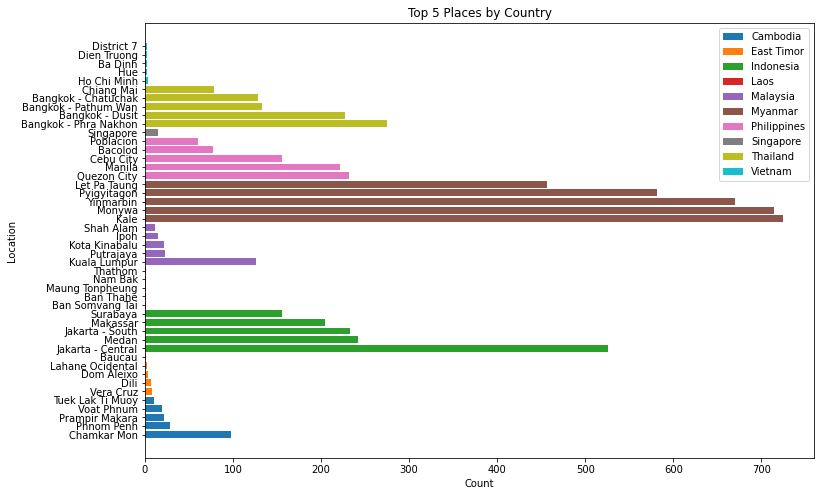

In [31]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['country', 'location']]

# Group the data by country and location to count occurrences
place_counts = df.groupby(['country', 'location']).size().reset_index(name='count')

# Sort the place counts by count in descending order for each country
place_counts = place_counts.sort_values(['country', 'count'], ascending=[True, False])

# Get the top 5 places by count for each country
top_places = place_counts.groupby('country').head(5)
# Print the top 5 places by each country
for country in top_places['country'].unique():
    places = top_places[top_places['country'] == country]
    print(f"\nTop 5 places in {country}:")
    for index, row in places.iterrows():
        print(f"{row['location']}: {row['count']} occurrences")

# Create a bar plot to visualize the top 5 places by each country
plt.figure(figsize=(12, 8))
for country in top_places['country'].unique():
    places = top_places[top_places['country'] == country]
    plt.barh(places['location'], places['count'], label=country)

plt.xlabel('Count')
plt.ylabel('Location')
plt.title('Top 5 Places by Country')
plt.legend()
plt.show()


In [32]:
df

,country,location
0,Philippines,Quezon City
1,Myanmar,Hpakant
2,Myanmar,Let Pa Taung
3,Myanmar,Daw Ngay Khu
4,Myanmar,Kayan
...,...,...
51669,Indonesia,Sorong
51670,Philippines,Davao City
51671,Philippines,Latih
51672,Philippines,Taguig


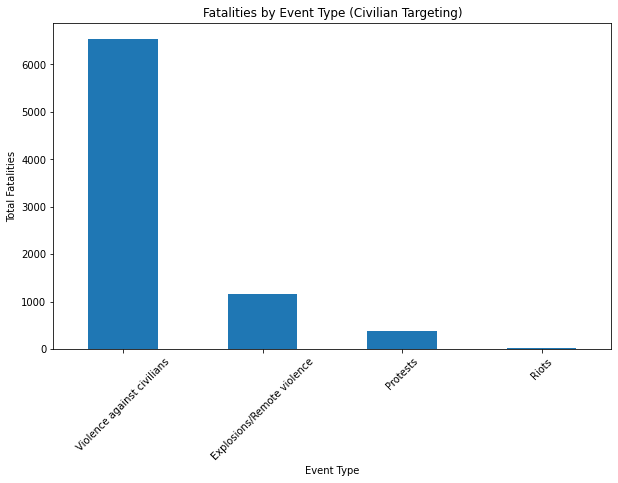

In [33]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['event_date', 'event_type', 'fatalities', 'civilian_targeting']]

# Filter events that target civilians
civilian_events = df[df['civilian_targeting'] == 'Civilian targeting']

# Check if there are civilian targeting events
if not civilian_events.empty:
    # Group events by event type and calculate the total fatalities
    fatalities_by_event = civilian_events.groupby('event_type')['fatalities'].sum().sort_values(ascending=False)

    # Plot the number of fatalities by event type
    plt.figure(figsize=(10, 6))
    fatalities_by_event.plot(kind='bar')
    plt.xlabel('Event Type')
    plt.ylabel('Total Fatalities')
    plt.title('Fatalities by Event Type (Civilian Targeting)')
    plt.xticks(rotation=45)
    plt.show()
else:
    print("No events specifically targeting civilians found.")


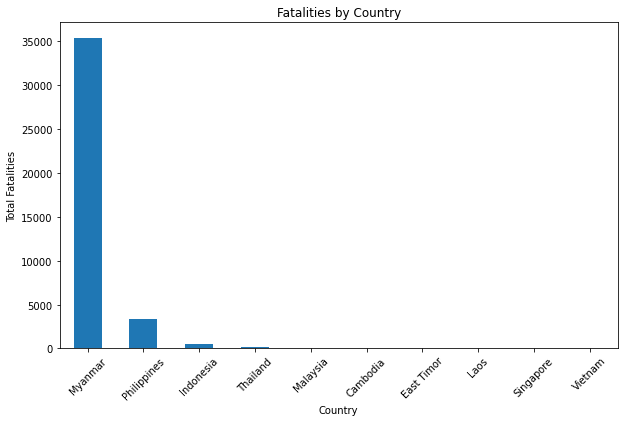

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have the data in a pandas DataFrame called 'data'
# Select the relevant columns for analysis
df = data[['event_date', 'country', 'fatalities']]

# Group events by country and calculate the total fatalities
fatalities_by_country = df.groupby('country')['fatalities'].sum().sort_values(ascending=False)

# Plot the total fatalities by country
plt.figure(figsize=(10, 6))
fatalities_by_country.plot(kind='bar')
plt.xlabel('Country')
plt.ylabel('Total Fatalities')
plt.title('Fatalities by Country')
plt.xticks(rotation=45)
plt.show()


In [36]:
import pandas as pd
import matplotlib.pyplot as plt



# Convert the 'event_date' column to datetime format
df['event_date'] = pd.to_datetime(df['event_date'])

# Set the 'event_date' column as the index
df = df.set_index('event_date')

# Group the data by event type and resample by month
event_counts = df['event_type'].resample('M').count()

# Plot the event frequency over time
plt.figure(figsize=(12, 6))
event_counts.plot()
plt.xlabel('Date')
plt.ylabel('Event Frequency')
plt.title('Event Frequency over Time')
plt.show()


KeyError: 'event_date'

In [37]:
import plotly.express as px

# Convert 'event_date' column to datetime type
data['event_date'] = pd.to_datetime(data['event_date'])

# Select the desired columns from the 'data' DataFrame
df = data[['event_date', 'event_type', 'country']]

# Group the data by country and event quarter
country_counts = df.groupby(['country', pd.Grouper(key='event_date', freq='Q')]).size().unstack().reset_index()

# Reshape the dataframe for plotting
country_counts_melt = pd.melt(country_counts, id_vars='country', var_name='Quarter', value_name='Event Frequency')

# Set plot parameters
fig = px.line(country_counts_melt, x='Quarter', y='Event Frequency', color='country',
              title='Quarterly Event Frequency by Country',
              labels={'Quarter': 'Quarter', 'Event Frequency': 'Event Frequency', 'country': 'Country'})

# Customize the layout
fig.update_layout(
    autosize=False,
    width=800,
    height=500,
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    title_font=dict(size=16),
)

# Show the plot
fig.show()


In [38]:
import plotly.express as px

# Convert 'event_date' column to datetime type
data['event_date'] = pd.to_datetime(data['event_date'])

# Select the desired columns from the 'data' DataFrame
df = data[['event_date', 'event_type', 'country']]

# Count the number of events by country
country_counts = df['country'].value_counts().reset_index()
country_counts.columns = ['country', 'event_count']

# Select the top countries with the highest event frequency
top_countries = country_counts.nlargest(5, 'event_count')['country'].tolist()

# Filter the data for the top countries
df_top_countries = df[df['country'].isin(top_countries)]

# Group the data by country and event quarter
country_counts = df_top_countries.groupby(['country', pd.Grouper(key='event_date', freq='Q')]).size().unstack().reset_index()

# Reshape the dataframe for plotting
country_counts_melt = pd.melt(country_counts, id_vars='country', var_name='Quarter', value_name='Event Frequency')

# Set plot parameters
fig = px.line(country_counts_melt, x='Quarter', y='Event Frequency', color='country',
              title='Quarterly Event Frequency by Top Countries',
              labels={'Quarter': 'Quarter', 'Event Frequency': 'Event Frequency', 'country': 'Country'})

# Customize the layout
fig.update_layout(
    autosize=False,
    width=800,
    height=500,
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    title_font=dict(size=16),
)

# Show the plot
fig.show()


In [39]:
import plotly.express as px

# Convert 'event_date' column to datetime type
data['event_date'] = pd.to_datetime(data['event_date'])

# Select the desired columns from the 'data' DataFrame
df = data[['event_date', 'event_type', 'country', 'fatalities']]

# Group the data by country and calculate the total fatalities
country_fatalities = df.groupby('country')['fatalities'].sum().reset_index()

# Select the top countries with the highest fatalities
top_countries = country_fatalities.nlargest(5, 'fatalities')['country'].tolist()

# Filter the data for the top countries
df_top_countries = df[df['country'].isin(top_countries)]

# Group the data by country and event quarter
country_fatalities = df_top_countries.groupby(['country', pd.Grouper(key='event_date', freq='Q')])['fatalities'].sum().unstack().reset_index()

# Reshape the dataframe for plotting
country_fatalities_melt = pd.melt(country_fatalities, id_vars='country', var_name='Quarter', value_name='Total Fatalities')

# Set plot parameters
fig = px.line(country_fatalities_melt, x='Quarter', y='Total Fatalities', color='country',
              title='Quarterly Total Fatalities by Top Countries',
              labels={'Quarter': 'Quarter', 'Total Fatalities': 'Total Fatalities', 'country': 'Country'})

# Customize the layout
fig.update_layout(
    autosize=False,
    width=800,
    height=500,
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    title_font=dict(size=16),
)

# Show the plot
fig.show()


In [40]:
df

,event_date,event_type,country,fatalities
0,2023-04-21,Protests,Philippines,0
1,2023-04-21,Violence against civilians,Myanmar,0
2,2023-04-21,Protests,Myanmar,0
3,2023-04-21,Battles,Myanmar,0
4,2023-04-21,Strategic developments,Myanmar,0
...,...,...,...,...
51669,2020-04-22,Riots,Indonesia,0
51670,2020-04-22,Battles,Philippines,0
51671,2020-04-22,Battles,Philippines,6
51672,2020-04-22,Violence against civilians,Philippines,3


In [41]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'data' with 'event_type', 'start_date', and 'end_date' columns

# Convert 'start_date' and 'end_date' columns to datetime
data['start_date'] = pd.to_datetime(data['start_date'])
data['end_date'] = pd.to_datetime(data['end_date'])

# Calculate the duration of each event in days
data['duration'] = (data['end_date'] - data['start_date']).dt.days

# Group the data by event type and calculate the average duration
avg_duration = data.groupby('event_type')['duration'].mean().reset_index(name='avg_duration')

# Sort the data by average duration
avg_duration = avg_duration.sort_values('avg_duration', ascending=False)

# Create a bar plot of average duration by event type
plt.figure(figsize=(10, 6))
plt.bar(avg_duration['event_type'], avg_duration['avg_duration'])
plt.xlabel('Event Type')
plt.ylabel('Average Duration (days)')
plt.title('Average Duration of Events by Event Type')
plt.xticks(rotation=45)
plt.show()


KeyError: 'start_date'

In [42]:
print(data.columns)

Index(['event_id_cnty', 'event_date', 'year', 'time_precision',
       'disorder_type', 'event_type', 'sub_event_type', 'actor1',
       'assoc_actor_1', 'inter1', 'actor2', 'assoc_actor_2', 'inter2',
       'interaction', 'civilian_targeting', 'iso', 'region', 'country',
       'admin1', 'admin2', 'admin3', 'location', 'latitude', 'longitude',
       'geo_precision', 'source', 'source_scale', 'notes', 'fatalities',
       'tags', 'timestamp'],
      dtype='object')


In [43]:
print(data['timestamp'])
print(data['event_date'])

0        1682433778
1        1682440954
2        1682440954
3        1682440954
4        1682440954
            ...    
51669    1655847849
51670    1657063707
51671    1657063707
51672    1657063707
51673    1657063719
Name: timestamp, Length: 51674, dtype: int64
0       2023-04-21
1       2023-04-21
2       2023-04-21
3       2023-04-21
4       2023-04-21
           ...    
51669   2020-04-22
51670   2020-04-22
51671   2020-04-22
51672   2020-04-22
51673   2020-04-22
Name: event_date, Length: 51674, dtype: datetime64[ns]


In [44]:
# Select the columns for correlation analysis
columns = ['fatalities', 'civilian_targeting', 'event_type', 'disorder_type']

# Calculate the correlation matrix
correlation_matrix = data[columns].corr()

# Display the correlation matrix
print(correlation_matrix)


            fatalities
fatalities         1.0


C:\Users\21263\AppData\Local\Temp\ipykernel_20336\1617442995.py:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



C:\Users\21263\AppData\Local\Temp\ipykernel_20336\92065298.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



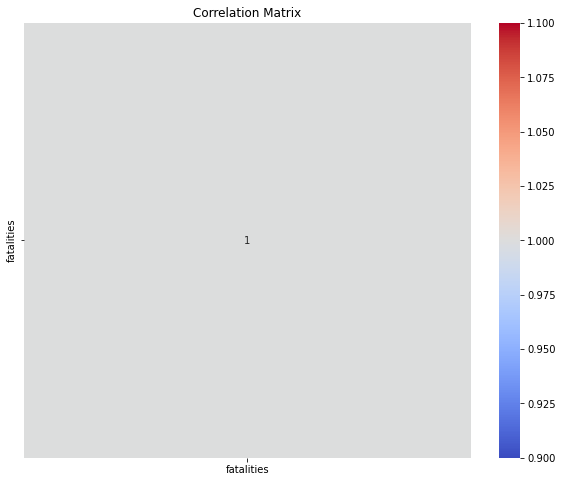

In [45]:
corr_columns = ['fatalities', 'event_type', 'civilian_targeting', 'region']
corr_data = data[corr_columns]
correlation_matrix = corr_data.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [46]:
import pandas as pd

# Select all features except the target variable
features = ['event_id_cnty', 'event_date', 'year', 'time_precision',
       'disorder_type', 'event_type', 'sub_event_type', 'actor1',
       'assoc_actor_1', 'inter1', 'actor2', 'assoc_actor_2', 'inter2',
       'interaction', 'civilian_targeting', 'iso', 'region', 'country',
       'admin1', 'admin2', 'admin3', 'location', 'latitude', 'longitude',
       'geo_precision', 'source', 'source_scale', 'notes', 'fatalities',
       'tags', 'timestamp']

# Subset the data with the selected features
subset_data = data[features + ['fatalities']].copy()

# Drop any rows with missing values
subset_data.dropna(inplace=True)

# Get the categorical columns
categorical_cols = subset_data.select_dtypes(include='object').columns

# Print the categorical columns
print(categorical_cols)


Index(['event_id_cnty', 'disorder_type', 'event_type', 'sub_event_type',
       'actor1', 'assoc_actor_1', 'actor2', 'assoc_actor_2',
       'civilian_targeting', 'region', 'country', 'admin1', 'admin2', 'admin3',
       'location', 'source', 'source_scale', 'notes', 'tags'],
      dtype='object')


In [47]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.preprocessing import OneHotEncoder

# Convert datetime columns to timestamps
subset_data['event_date'] = pd.to_datetime(subset_data['event_date']).view('int64') // 10**9
subset_data['timestamp'] = pd.to_datetime(subset_data['timestamp']).view('int64') // 10**9



# Select all features except the target variable
features = ['event_id_cnty', 'event_date', 'year', 'time_precision',
       'disorder_type', 'event_type', 'sub_event_type', 'actor1',
       'assoc_actor_1', 'inter1', 'actor2', 'assoc_actor_2', 'inter2',
       'interaction', 'civilian_targeting', 'iso', 'region', 'country',
       'admin1', 'admin2', 'admin3', 'location', 'latitude', 'longitude',
       'geo_precision', 'source', 'source_scale', 'notes', 'fatalities',
       'tags', 'timestamp']

# Subset the data with the selected features
subset_data = data[features + ['fatalities']].copy()

# Drop any rows with missing values
subset_data.dropna(inplace=True)

# Split the data into features and target variable
X = subset_data.drop('fatalities', axis=1)
y = subset_data['fatalities']

# Encode categorical variables using one-hot encoding
categorical_cols = ['event_id_cnty', 'disorder_type', 'event_type', 'sub_event_type',
       'actor1', 'assoc_actor_1', 'actor2', 'assoc_actor_2',
       'civilian_targeting', 'region', 'country', 'admin1', 'admin2', 'admin3',
       'location', 'source', 'source_scale', 'notes', 'tags']
encoder = OneHotEncoder(sparse=False, drop='first')
X_encoded = pd.DataFrame(encoder.fit_transform(X[categorical_cols]))

# Combine encoded features with numerical features
X_encoded.columns = encoder.get_feature_names(categorical_cols)
X_numerical = X.drop(categorical_cols, axis=1)
X_processed = pd.concat([X_numerical, X_encoded], axis=1)

# Initialize the Random Forest Regressor model
model = RandomForestRegressor()

# Initialize the RFE object
rfe = RFE(model, n_features_to_select=5)  # Select top 5 features

# Fit the RFE object to the data
rfe.fit(X_processed, y)

# Get the selected feature names
selected_features = X_processed.columns[rfe.support_]

# Print the selected features
print(selected_features)


C:\Users\21263\anaconda3\envs\snowflakes\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



TypeError: The DType <class 'numpy.dtype[datetime64]'> could not be promoted by <class 'numpy.dtype[float64]'>. This means that no common DType exists for the given inputs. For example they cannot be stored in a single array unless the dtype is `object`. The full list of DTypes is: (<class 'numpy.dtype[datetime64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>, <class 'numpy.dtype[float64]'>)

In [ ]:
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Drop the 'timestamp' column
X_processed = subset_data.drop('timestamp', axis=1)

# Convert datetime column to numeric representation
X_processed['event_date'] = pd.to_numeric(X_processed['event_date'])

# Define the target variable
y = subset_data['fatalities']

# Perform one-hot encoding on categorical variables
X_encoded = pd.get_dummies(X_processed)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Initialize the random forest regressor
rf_regressor = RandomForestRegressor()

# Initialize the RFE object
rfe = RFE(estimator=rf_regressor, n_features_to_select=5)

# Fit the RFE object to the data
rfe.fit(X_train, y_train)

# Get the selected feature names
selected_features = X_train.columns[rfe.support_]

# Print the selected features
print("Selected Features:")
print(selected_features)


In [48]:
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Drop the 'timestamp' column
X_processed = subset_data.drop('timestamp', axis=1)

# Convert datetime column to numeric representation
X_processed['event_date'] = pd.to_numeric(X_processed['event_date'])

# Define the target variable
y = subset_data['fatalities']

# Perform one-hot encoding on categorical variables
X_encoded = pd.get_dummies(X_processed)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Initialize the random forest regressor
rf_regressor = RandomForestRegressor()

# Initialize the RFE object
rfe = RFE(estimator=rf_regressor, n_features_to_select=5)

# Fit the RFE object to the training data
rfe.fit(X_train, y_train)

# Get the selected feature names
selected_features = X_train.columns[rfe.support_]

# Print the selected features
print("Selected Features:")
print(selected_features)


Selected Features:
Index(['event_date', 'fatalities', 'fatalities', 'event_id_cnty_MMR13032',
       'admin3_North Okkalapa'],
      dtype='object')


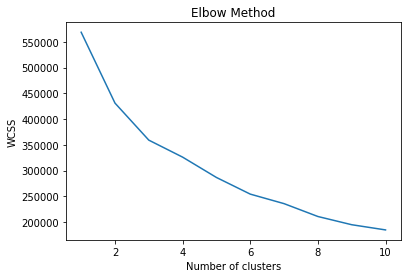

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Extract the data for clustering
X = data.copy()

# Drop any non-numeric columns
X = X.select_dtypes(include='number')

# Standardize the data
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# Calculate the WCSS for each value of k
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_std)
    wcss.append(kmeans.inertia_)

# Plot the WCSS as a function of k
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.title('Elbow Method')
plt.show()


In [50]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# calculate silhouette score for different values of k
silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X_std)
    score = silhouette_score(X_std, kmeans.labels_)
    silhouette_scores.append(score)

# find the optimal number of clusters based on silhouette score
optimal_k = silhouette_scores.index(max(silhouette_scores)) + 2

print(f"The optimal number of clusters based on silhouette score is {optimal_k}")

The optimal number of clusters based on silhouette score is 9


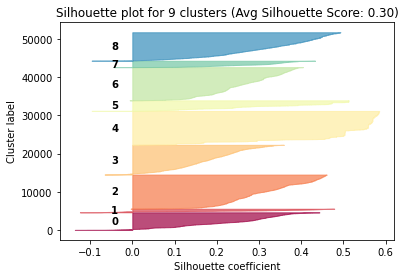

In [51]:
from sklearn.metrics import silhouette_samples

# Set the number of clusters
n_clusters = 9

# Perform clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
cluster_labels = kmeans.fit_predict(X_std)

# Calculate the silhouette score
silhouette_avg = silhouette_score(X_std, cluster_labels)

# Calculate the silhouette scores for each sample
sample_silhouette_values = silhouette_samples(X_std, cluster_labels)

# Plot the clusters
fig, ax = plt.subplots()
y_lower = 10
for i in range(n_clusters):
    # Aggregate the silhouette scores for samples in the current cluster
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    ith_cluster_silhouette_values.sort()
    
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    
    color = plt.cm.get_cmap("Spectral")(i / n_clusters)
    ax.fill_betweenx(
        np.arange(y_lower, y_upper),
        0,
        ith_cluster_silhouette_values,
        facecolor=color,
        edgecolor=color,
        alpha=0.7,
    )
    
    ax.text(
        -0.05,
        y_lower + 0.5 * size_cluster_i,
        str(i),
        color="black",
        fontweight="bold",
        verticalalignment="center",
    )
    
    y_lower = y_upper + 10

ax.set_xlabel("Silhouette coefficient")
ax.set_ylabel("Cluster label")
ax.set_title("Silhouette plot for {} clusters (Avg Silhouette Score: {:.2f})".format(n_clusters, silhouette_avg))

plt.show()

In [52]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping



# Extract the time series data column
time_series_data = df['event_date'].values

# Convert the date column to datetime format
df['event_date'] = pd.to_datetime(df['event_date'])

# Sort the dataframe by the event_date
df.sort_values('event_date', inplace=True)

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(time_series_data.reshape(-1, 1))

# Split the data into training and test sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create the input sequences and labels for training and testing
def create_sequences(data, sequence_length):
    X = []
    y = []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        y.append(data[i+sequence_length])
    return np.array(X), np.array(y)

sequence_length = 10  # Adjust the sequence length as needed
X_train, y_train = create_sequences(train_data, sequence_length)
X_test, y_test = create_sequences(test_data, sequence_length)

# Build and train the LSTM model
model = Sequential()
model.add(LSTM(units=64, input_shape=(sequence_length, 1)))
model.add(Dense(units=1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Use early stopping to prevent overfitting
early_stopping = EarlyStopping(patience=3, restore_best_weights=True)

model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping])

# Make predictions and evaluate the model
train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

# Inverse transform the predictions
train_predictions = scaler.inverse_transform(train_predictions)
test_predictions = scaler.inverse_transform(test_predictions)

# Evaluate the model (e.g., calculate RMSE)
train_rmse = np.sqrt(np.mean((train_predictions - scaler.inverse_transform(y_train.reshape(-1, 1)))**2))
test_rmse = np.sqrt(np.mean((test_predictions - scaler.inverse_transform(y_test.reshape(-1, 1)))**2))


TypeError: Descriptors cannot not be created directly.
If this call came from a _pb2.py file, your generated code is out of date and must be regenerated with protoc >= 3.19.0.
If you cannot immediately regenerate your protos, some other possible workarounds are:
 1. Downgrade the protobuf package to 3.20.x or lower.
 2. Set PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python (but this will use pure-Python parsing and will be much slower).

More information: https://developers.google.com/protocol-buffers/docs/news/2022-05-06#python-updates

In [53]:
# Generate predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Plotting the predictions against real values
plt.figure(figsize=(12, 6))
plt.plot(y_train, label='Actual')
plt.plot(train_predict, label='Predicted (Training)')
plt.plot(len(y_train) + np.arange(len(y_test)), y_test, label='Actual (Test)')
plt.plot(len(y_train) + np.arange(len(y_test)), test_predict, label='Predicted (Test)')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('LSTM Predictions')
plt.legend()
plt.show()


NotFittedError: This RandomForestRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

In [54]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt

# Assuming 'data' is your original dataset
df = data[['event_date', 'fatalities']].copy()

# Convert 'event_date' to datetime format
df['event_date'] = pd.to_datetime(df['event_date'])

# Sort the dataframe by 'event_date' in ascending order
df = df.sort_values('event_date')

# Set 'event_date' as the index of the dataframe
df = df.set_index('event_date')

# Normalize the 'fatalities' column
scaler = MinMaxScaler()
df['fatalities'] = scaler.fit_transform(df['fatalities'].values.reshape(-1, 1))

# Split the data into training and testing sets
train_size = int(len(df) * 0.8)  # 80% of data for training
train_data = df.iloc[:train_size]
test_data = df.iloc[train_size:]

# Convert the data into sequences
def create_sequences(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

# Define the sequence length
sequence_length = 10

# Create training sequences and their corresponding targets
X_train, y_train = create_sequences(train_data.values, sequence_length)

# Create testing sequences and their corresponding targets
X_test, y_test = create_sequences(test_data.values, sequence_length)

# Build the LSTM model
model = Sequential()
model.add(LSTM(units=64, input_shape=(sequence_length, 1)))
model.add(Dense(units=1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# Predict the fatalities using the trained model
train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

# Inverse transform the predictions to the original scale
train_predictions = scaler.inverse_transform(train_predictions)
test_predictions = scaler.inverse_transform(test_predictions)

# Plot the predictions against the actual values
plt.figure(figsize=(12, 6))
plt.plot(df.index[:train_size], df['fatalities'][:train_size], label='Actual (Train)')
plt.plot(df.index[train_size+sequence_length:], df['fatalities'][train_size+sequence_length:], label='Actual (Test)')

train_pred_index = df.index[sequence_length:train_size+sequence_length]
test_pred_index = df.index[train_size+2*sequence_length:train_size+2*sequence_length+len(test_predictions)]

plt.plot(train_pred_index[:len(train_predictions)], train_predictions, label='Predicted (Train)')
plt.plot(test_pred_index[:len(test_predictions)], test_predictions, label='Predicted (Test)')

plt.xlabel('Date')
plt.ylabel('Fatalities')
plt.title('LSTM Predictions')
plt.legend()
plt.show()


TypeError: Descriptors cannot not be created directly.
If this call came from a _pb2.py file, your generated code is out of date and must be regenerated with protoc >= 3.19.0.
If you cannot immediately regenerate your protos, some other possible workarounds are:
 1. Downgrade the protobuf package to 3.20.x or lower.
 2. Set PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python (but this will use pure-Python parsing and will be much slower).

More information: https://developers.google.com/protocol-buffers/docs/news/2022-05-06#python-updates

In [55]:
# Plot the predictions against the actual values
plt.figure(figsize=(12, 6))
plt.plot(df.index[:train_size], df['fatalities'][:train_size], label='Actual (Train)')
plt.plot(df.index[train_size+sequence_length:], df['fatalities'][train_size+sequence_length:], label='Actual (Test)')

train_pred_index = df.index[sequence_length:train_size+sequence_length]
test_pred_index = df.index[train_size+2*sequence_length:train_size+2*sequence_length+len(test_predictions)]

train_pred_index = train_pred_index[:len(train_predictions)]
test_pred_index = test_pred_index[:len(test_predictions)]

plt.plot(train_pred_index, train_predictions, label='Predicted (Train)')
plt.plot(test_pred_index, test_predictions, label='Predicted (Test)')

plt.xlabel('Date')
plt.ylabel('Fatalities')
plt.title('LSTM Predictions')
plt.legend()
plt.show()


NameError: name 'train_size' is not defined

<Figure size 864x432 with 0 Axes>

In [56]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data


# Extract the 'fatalities' column as the target variable
target_variable = df[['fatalities']].values.astype('float32')

# Train-test split for time series
train_size = int(len(target_variable) * 0.67)
test_size = len(target_variable) - train_size
train, test = target_variable[:train_size], target_variable[train_size:]

def create_dataset(dataset, lookback):
    """Transform a time series into a prediction dataset
    
    Args:
        dataset: A numpy array of time series, first dimension is the time steps
        lookback: Size of window for prediction
    """
    X, y = [], []
    for i in range(len(dataset) - lookback):
        feature = dataset[i:i+lookback]
        target = dataset[i+1:i+lookback+1]
        X.append(feature)
        y.append(target)
    return torch.tensor(X), torch.tensor(y)

lookback = 4
X_train, y_train = create_dataset(train, lookback=lookback)
X_test, y_test = create_dataset(test, lookback=lookback)

class FatalitiesModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.lstm = nn.LSTM(input_size=1, hidden_size=50, num_layers=1, batch_first=True)
        self.linear = nn.Linear(50, 1)
    
    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.linear(x)
        return x

model = FatalitiesModel()
optimizer = optim.Adam(model.parameters())
loss_fn = nn.MSELoss()
loader = data.DataLoader(data.TensorDataset(X_train, y_train), shuffle=True, batch_size=8)

n_epochs = 2000
for epoch in range(n_epochs):
    model.train()
    for X_batch, y_batch in loader:
        y_pred = model(X_batch)
        loss = loss_fn(y_pred, y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    # Validation
    if epoch % 100 == 0:
        model.eval()
        with torch.no_grad():
            y_pred = model(X_train)
            train_rmse = np.sqrt(loss_fn(y_pred, y_train))
            y_pred = model(X_test)
            test_rmse = np.sqrt(loss_fn(y_pred, y_test))
        print("Epoch %d: train RMSE %.4f, test RMSE %.4f" % (epoch, train_rmse, test_rmse))

with torch.no_grad():
    # Shift train predictions for plotting
    train_plot = np.ones_like(target_variable) * np.nan
    y_pred = model(X_train)
    y_pred = y_pred[:, -1, :]
    train_plot[lookback:train_size] = y_pred[:, 0]
    
    # Shift test predictions for plotting
    test_plot = np.ones_like(target_variable) * np.nan
    test_plot[train_size+lookback:len(target_variable)] = model(X_test)[:, -1, 0]

# Plot
plt.figure(figsize=(10, 6))
plt.plot(target_variable, label='Actual')
plt.plot(train_plot, c='r', label='Predicted (Train)')
plt.plot(test_plot, c='g', label='Predicted (Test)')
plt.xlabel('Time')
plt.ylabel('Fatalities')
plt.title('LSTM Predictions for Fatalities')
plt.legend()
plt.show()



C:\Users\21263\AppData\Local\Temp\ipykernel_20336\4180759868.py:31: UserWarning:

Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:248.)



Epoch 0: train RMSE 3.5020, test RMSE 2.0869
Epoch 100: train RMSE 3.4807, test RMSE 2.1073


KeyboardInterrupt: 

In [ ]:

data = pd.read_csv('2020-04-22-2023-05-14-Southeast_Asia.csv')
# Assuming 'data' is your original dataset
df = data[['event_date', 'fatalities']].copy()

# Load the dataset
print(df.columns)

In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import matplotlib.pyplot as plt

df = pd.read_csv('2020-04-22-2023-05-14-Southeast_Asia.csv')


# Convert 'event_date' column to datetime object
df['event_date'] = pd.to_datetime(df['event_date'])

# Set 'event_date' as the index
df.set_index('event_date', inplace=True)

# Extract 'fatalities' column and convert to float32
timeseries = df[['fatalities']].values.astype('float32')

# Train-test split for time series
train_size = int(len(timeseries) * 0.67)
test_size = len(timeseries) - train_size
train, test = timeseries[:train_size], timeseries[train_size:]

# Function to create the prediction dataset
def create_dataset(dataset, lookback):
    X, y = [], []
    for i in range(len(dataset) - lookback):
        feature = dataset[i:i+lookback]
        target = dataset[i+1:i+lookback+1]
        X.append(feature)
        y.append(target)
    return np.array(X), np.array(y)

lookback = 4
X_train, y_train = create_dataset(train, lookback=lookback)
X_test, y_test = create_dataset(test, lookback=lookback)

# Convert numpy arrays to tensors
X_train = torch.from_numpy(X_train)
y_train = torch.from_numpy(y_train)
X_test = torch.from_numpy(X_test)
y_test = torch.from_numpy(y_test)

# Define the LSTM model
class AirModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.lstm = nn.LSTM(input_size=1, hidden_size=50, num_layers=1, batch_first=True)
        self.linear = nn.Linear(50, 1)
        
    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.linear(x)
        return x

# Create an instance of the model
model = AirModel()

# Set up the optimizer and loss function
optimizer = optim.Adam(model.parameters())
loss_fn = nn.MSELoss()

# Create a data loader for training
train_data = data.TensorDataset(X_train, y_train)
loader = data.DataLoader(train_data, shuffle=True, batch_size=8)

# Training loop
n_epochs = 50
for epoch in range(n_epochs):
    model.train()
    for X_batch, y_batch in loader:
        y_pred = model(X_batch)
        loss = loss_fn(y_pred, y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    # Validation
    if epoch % 100 == 0:
        model.eval()
        with torch.no_grad():
            y_pred_train = model(X_train)
            train_rmse = torch.sqrt(loss_fn(y_pred_train, y_train))
            y_pred_test = model(X_test)
            test_rmse = torch.sqrt(loss_fn(y_pred_test, y_test))
        print("Epoch %d: train RMSE %.4f, test RMSE %.4f" % (epoch, train_rmse, test_rmse))

# Generate predictions
model.eval()
# Calculate RMSE
with torch.no_grad():
    train_rmse = torch.sqrt(loss_fn(y_pred_train, y_train))
    test_rmse = torch.sqrt(loss_fn(y_pred_test, y_test))

print(f"Train RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")

with torch.no_grad():
    y_pred_train = model(X_train)
    y_pred_train = y_pred_train[:, -1, :]
    train_plot = np.ones_like(timeseries) * np.nan
    train_plot[lookback:train_size] = y_pred_train.numpy()

    y_pred_test = model(X_test)
    y_pred_test = y_pred_test[:, -1, :]
    test_plot = np.ones_like(timeseries) * np.nan
    test_plot[train_size+lookback:] = y_pred_test.numpy().flatten().reshape(-1, 1)

# Plot
plt.plot(timeseries, label='Actual')
plt.plot(train_plot, c='r', label='Train Predictions')
plt.plot(test_plot, c='g', label='Test Predictions')
plt.legend()
plt.show()

In [ ]:
# Plot
plt.figure(figsize=(10, 6))  # Set the figure size
plt.plot(timeseries, label='Actual', linewidth=2)  # Customize the line width
plt.plot(train_plot, c='r', label='Train Predictions', linewidth=1)  # Customize the line color and width
plt.plot(test_plot, c='g', label='Test Predictions', linewidth=1)  # Customize the line color and width
plt.xlabel('Time')
plt.ylabel('Fatalities')
plt.title('Prediction of Fatalities')
plt.legend()
plt.grid(True)  # Add grid lines
plt.tight_layout()  # Adjust the spacing of the plot
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import matplotlib.pyplot as plt

df = pd.read_csv('2020-04-22-2023-05-14-Southeast_Asia.csv')


# Convert 'event_date' column to datetime object
df['event_date'] = pd.to_datetime(df['event_date'])

# Set 'event_date' as the index
df.set_index('event_date', inplace=True)

# Extract 'fatalities' column and convert to float32
timeseries = df[['fatalities']].values.astype('float32')

# Train-test split for time series
train_size = int(len(timeseries) * 0.67)
test_size = len(timeseries) - train_size
train, test = timeseries[:train_size], timeseries[train_size:]

# Function to create the prediction dataset
def create_dataset(dataset, lookback):
    X, y = [], []
    for i in range(len(dataset) - lookback):
        feature = dataset[i:i+lookback]
        target = dataset[i+1:i+lookback+1]
        X.append(feature)
        y.append(target)
    return np.array(X), np.array(y)

lookback = 4
X_train, y_train = create_dataset(train, lookback=lookback)
X_test, y_test = create_dataset(test, lookback=lookback)

# Convert numpy arrays to tensors
X_train = torch.from_numpy(X_train)
y_train = torch.from_numpy(y_train)
X_test = torch.from_numpy(X_test)
y_test = torch.from_numpy(y_test)

# Define the LSTM model
class AirModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.lstm = nn.LSTM(input_size=1, hidden_size=50, num_layers=1, batch_first=True)
        self.linear = nn.Linear(50, 1)
        
    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.linear(x)
        return x

# Create an instance of the model
model = AirModel()

# Set up the optimizer and loss function
optimizer = optim.Adam(model.parameters())
loss_fn = nn.MSELoss()

# Create a data loader for training
train_data = data.TensorDataset(X_train, y_train)
loader = data.DataLoader(train_data, shuffle=True, batch_size=8)

# Training loop
n_epochs = 100

for epoch in range(n_epochs):
    model.train()
    for X_batch, y_batch in loader:
        y_pred = model(X_batch)
        loss = loss_fn(y_pred, y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    # Validation
    model.eval()
    with torch.no_grad():
        y_pred_train = model(X_train)
        train_rmse = torch.sqrt(loss_fn(y_pred_train, y_train))
        y_pred_test = model(X_test)
        test_rmse = torch.sqrt(loss_fn(y_pred_test, y_test))
    
    # Print RMSE for current epoch
    print("Epoch %d: train RMSE %.4f, test RMSE %.4f" % (epoch, train_rmse, test_rmse))



# Generate predictions
model.eval()
# Calculate RMSE
with torch.no_grad():
    train_rmse = torch.sqrt(loss_fn(y_pred_train, y_train))
    test_rmse = torch.sqrt(loss_fn(y_pred_test, y_test))

print(f"Train RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")

with torch.no_grad():
    y_pred_train = model(X_train)
    y_pred_train = y_pred_train[:, -1, :]
    train_plot = np.ones_like(timeseries) * np.nan
    train_plot[lookback:train_size] = y_pred_train.numpy()

    y_pred_test = model(X_test)
    y_pred_test = y_pred_test[:, -1, :]
    test_plot = np.ones_like(timeseries) * np.nan
    test_plot[train_size+lookback:] = y_pred_test.numpy().flatten().reshape(-1, 1)



In [ ]:
# Plot
plt.figure(figsize=(12, 6))
plt.plot(timeseries, label='Actual')
plt.plot(train_plot, c='r', label='Train Predictions')
plt.plot(test_plot, c='g', label='Test Predictions')
plt.title('Fatalities Time Series Prediction')
plt.xlabel('Time')
plt.ylabel('Fatalities')
plt.legend()
plt.show()

In [ ]:
# Calculate the range of the target variable (fatalities)
target_range = np.max(timeseries) - np.min(timeseries)

# Compare RMSE to the target range
train_rmse_scaled = train_rmse / target_range
test_rmse_scaled = test_rmse / target_range

# Print scaled RMSE values
print("Scaled Train RMSE: %.4f" % train_rmse_scaled)
print("Scaled Test RMSE: %.4f" % test_rmse_scaled)


In [ ]:
def calculate_scaled_rmse(actual, predicted):
    scale = np.max(actual) - np.min(actual)
    return np.sqrt(np.mean(((actual - predicted) / scale) ** 2))

scaled_train_rmse = calculate_scaled_rmse(train, train_plot[lookback:train_size].flatten())
scaled_test_rmse = calculate_scaled_rmse(test, test_plot[train_size+lookback:].flatten())

print("Scaled Train RMSE: %.4f" % scaled_train_rmse)
print("Scaled Test RMSE: %.4f" % scaled_test_rmse)


In [ ]:
# Set the model to evaluation mode
model.eval()

# Make predictions
with torch.no_grad():
    predictions = model(X_test)

# Flatten the predictions and convert them to numpy array
predictions = predictions.flatten().numpy()

# Define the date range for projection
start_date = df.index[-1] + datetime.timedelta(days=1)  # Start from the next day
end_date = datetime.datetime(2024, 4, 24)  # Projection until April 24, 2023
# Generate the date range
date_range = pd.date_range(start=start_date, periods=len(predictions), freq='D')

# Plot the predictions
plt.plot(date_range, predictions, label='Predictions')
plt.xlabel('Date')
plt.ylabel('Fatalities')
plt.legend()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import matplotlib.pyplot as plt
import statsmodels.api as sm

df = pd.read_csv('2020-04-22-2023-05-14-Southeast_Asia.csv')

# Convert 'event_date' column to datetime object
df['event_date'] = pd.to_datetime(df['event_date'])

# Set 'event_date' as the index
df.set_index('event_date', inplace=True)

# Extract 'fatalities' column and convert to float32
timeseries = df[['fatalities']].values.astype('float32')

# Train-test split for time series
train_size = int(len(timeseries) * 0.67)
test_size = len(timeseries) - train_size
train, test = timeseries[:train_size], timeseries[train_size:]

# Function to create the prediction dataset
def create_dataset(dataset, lookback):
    X, y = [], []
    for i in range(len(dataset) - lookback):
        feature = dataset[i:i+lookback]
        target = dataset[i+1:i+lookback+1]
        X.append(feature)
        y.append(target)
    return np.array(X), np.array(y)

lookback = 4
X_train, y_train = create_dataset(train, lookback=lookback)
X_test, y_test = create_dataset(test, lookback=lookback)

# Convert numpy arrays to tensors
X_train = torch.from_numpy(X_train)
y_train = torch.from_numpy(y_train)
X_test = torch.from_numpy(X_test)
y_test = torch.from_numpy(y_test)

# Define the LSTM model
class AirModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.lstm = nn.LSTM(input_size=1, hidden_size=50, num_layers=1, batch_first=True)
        self.linear = nn.Linear(50, 1)
        
    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.linear(x)
        return x

# Create an instance of the model
model = AirModel()

# Set up the optimizer and loss function
optimizer = optim.Adam(model.parameters())
loss_fn = nn.MSELoss()

# Create a data loader for training
train_data = data.TensorDataset(X_train, y_train)
loader = data.DataLoader(train_data, shuffle=True, batch_size=8)

# Training loop
n_epochs = 50
for epoch in range(n_epochs):
    model.train()
    for X_batch, y_batch in loader:
        y_pred = model(X_batch)
        loss = loss_fn(y_pred, y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    # Validation
    if epoch % 100 == 0:
        model.eval()
        with torch.no_grad():
            y_pred_train = model(X_train)
            train_rmse = torch.sqrt(loss_fn(y_pred_train, y_train))
            y_pred_test = model(X_test)
            test_rmse = torch.sqrt(loss_fn(y_pred_test, y_test))
        print("Epoch %d: train RMSE %.4f, test RMSE %.4f" % (epoch, train_rmse, test_rmse))

# Generate predictions
model.eval()
with torch.no_grad():
    y_pred_train = model(X_train)
    y_pred_train = y_pred_train[:, -1, :]
    train_plot = np.ones_like(timeseries) * np.nan
    train_plot[lookback:train_size] = y_pred_train
    y_pred_test = model(X_test)
    y_pred_test = y_pred_test[:, -1, :]
    test_plot = np.ones_like(timeseries) * np.nan
    test_plot[train_size+lookback:] = y_pred_test.numpy().flatten().reshape(-1, 1)

# Plot LSTM predictions
plt.plot(timeseries, label='Actual')
plt.plot(train_plot, c='r', label='Train Predictions')
plt.plot(test_plot, c='g', label='Test Predictions')
plt.legend()
plt.show()

# Fit ARIMA model to the training data
arima_model = sm.tsa.ARIMA(train, order=(1, 0, 0))
arima_model_fit = arima_model.fit()

# Generate ARIMA predictions
arima_predictions = arima_model_fit.predict(start=train_size+lookback, end=train_size+lookback+test_size-1)


# Plot ARIMA predictions
plt.plot(timeseries, label='Actual')
plt.plot(train_plot, c='r', label='Train LSTM Predictions')
plt.plot(test_plot, c='g', label='Test LSTM Predictions')
plt.plot(arima_predictions, c='b', label='ARIMA Predictions')
plt.legend()
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error

# Calculate ARIMA predictions
arima_predictions = arima_model_fit.predict(start=train_size+lookback, end=len(timeseries)-1)

# Calculate ARIMA RMSE
arima_rmse = np.sqrt(mean_squared_error(test, arima_predictions))

print(f"ARIMA RMSE: {arima_rmse:.4f}")
